# Image Layer Project




### Image Display Sample (PyQt5)
Sample Dataset: <br>
**Height**: 3543 <br>
**Width**: 5906

|Order|X-Cords|Y-Cords|
|-----|-------|-------|
|90|1366|244|
|130|3188|433|
|120|2279|173|
|140|1358|98|
|80|661|232|
|70|887|65|
|100|1055|196|
|40|2236|2342|
|30|3318|539|


|||
|-|-|
|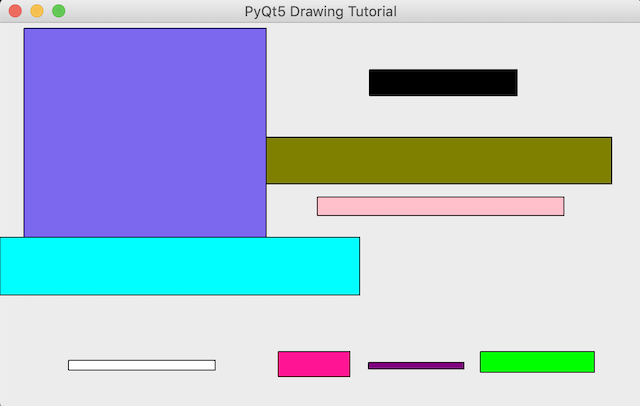 | 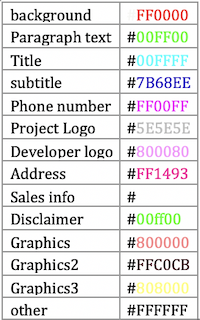|

### Heatmap Development
Layer data organized and sorted into 14 different order ID groups

Formula for normalizing layer data:
$$
\begin{eqnarray}
x &=& \frac{xmax-xmin}{height} \\
y &=& \frac{ymax-ymin}{width} \\
\end{eqnarray}
$$

Normalized Data is standarized through Min-max scaling to fit a range of 0.0-1.0
#### Sample Code to generate heatmap for layer 20:

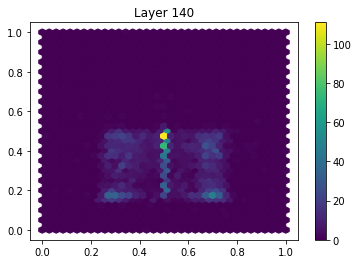

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import preprocessing

data = '20test2.csv'
df = pd.io.parsers.read_csv(
    data, header=None, usecols=[0,1])

df.columns=['xcenter','ycenter']

minmax_scale = preprocessing.MinMaxScaler().fit(df[['xcenter','ycenter']])
df_minmax = minmax_scale.transform(df[['xcenter','ycenter']])

def plot():

    plt.hexbin(df_minmax[:,0],df_minmax[:,1],gridsize=35)
    plt.title('Layer 140')
    plt.colorbar()
    plt.show()

plot()

#### Heatmaps for 14 layers:
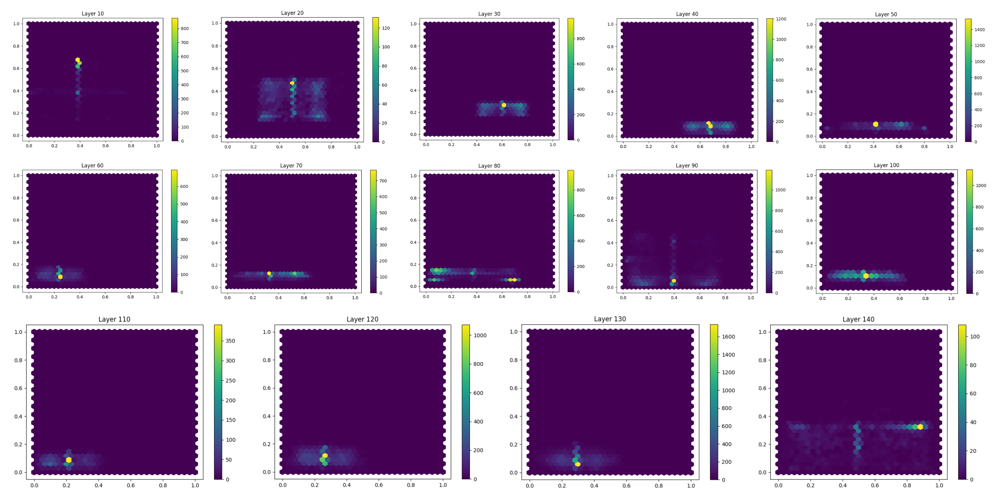

## Data Projection Tests:

Roadmap:
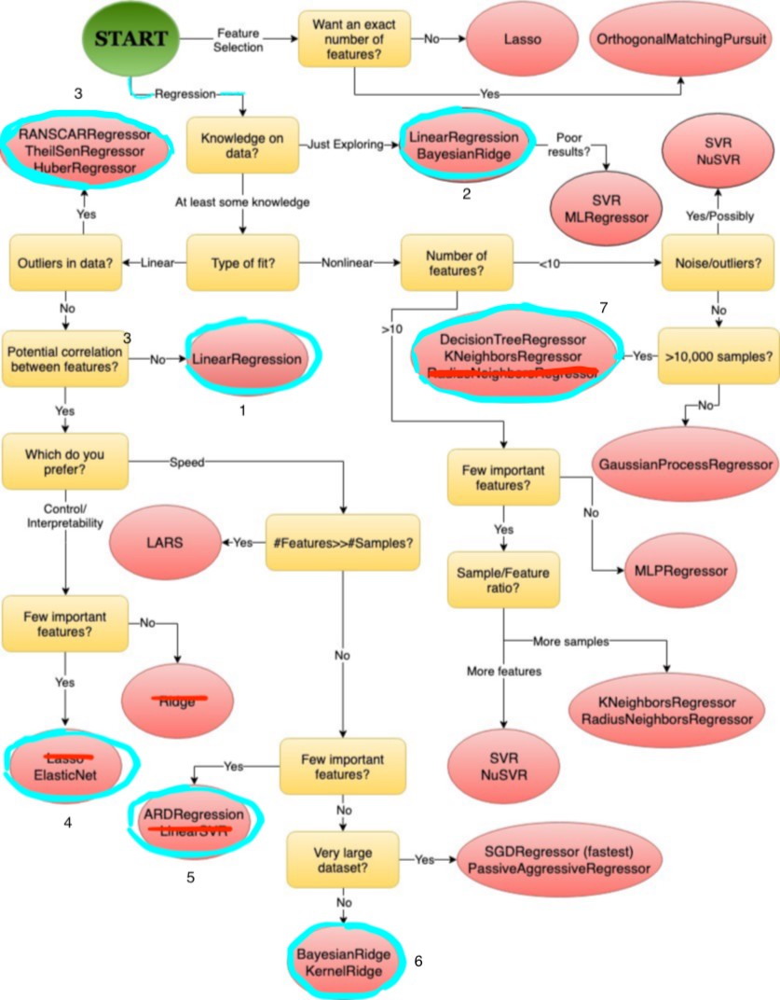



### 1. Linear Regression Analysis

Normalized data from heatmap development was used to train a linear regression model to generate a layer compilation image

Linear Regression Model consists of two regression steps:

#### Step 1:
**Inputs from User**: Width and Height of every desired layer  <br>
**Output**: Xmin, Xmax, Ymin, Ymax

In [2]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

def reg():
    data = ['test10.csv','test20.csv','test30.csv','test40.csv','test50.csv','test60.csv','test70.csv','test80.csv','test90.csv','test100.csv','test110.csv','test120.csv','test130.csv','test140.csv']

    x_new = 'xnew.csv'
    x_new = pd.read_csv(x_new).values
    x_new = np.array(x_new)

    def reg1():
        x2 = []
        z = 0
        for i in range(0, len(data)):
            datax = data[i]

            d = pd.read_csv(
                datax, usecols=['w', 'h'])
            res = pd.read_csv(
                datax, usecols=['xmin', 'ymin', 'xmax', 'ymax'])

            x = d
            y = res

            x, y = np.array(x), np.array(y)
            model = LinearRegression().fit(x, y)
            
            xz = [x_new[z]]
            y_new = model.predict(xz)
            x2.append(y_new)
            z = z +1

        x2 = np.array(x2)
        x2.shape = 14, 4
        dx = pd.DataFrame(x2)
        dx.to_csv('xnew2.csv', index=False)
    
    reg1()
    x_new = pd.read_csv("xnew.csv")
    x_new2 = pd.read_csv("xnew2.csv")

    merged = x_new.merge(x_new2, left_index=True,right_index=True)
    merged.to_csv("output.csv",index = False)
    
    output = pd.read_csv("output.csv").values
    output = pd.DataFrame(output, columns = ['width','height','xmin', 'ymin', 'xmax', 'ymax'])
    print(output)

reg()

     width  height         xmin         ymin         xmax         ymax
0   3365.0  4960.0   130.943266  2641.117911  3056.174873  3938.119096
1    530.0   546.0   398.387161   681.459717  1082.647551  1078.003818
2   1355.0  1355.0   455.852172   738.254618  1223.961207  1173.219835
3   1564.0  1566.0   400.142435   630.608587  1351.087420  1359.807868
4   3364.0   704.0  1641.121945   960.335295  2441.670330  1093.033422
5   4107.0   983.0  1093.556990   770.246822  2386.957927   987.176591
6   4286.0  1317.0  2026.147064  1504.405753  3132.509264  1599.873141
7   2562.0  2475.0   927.652803  1314.572335  1249.234076  1433.921758
8    898.0    93.0   313.110120   113.112915   561.777769   226.515633
9    342.0   348.0   249.656984   525.275889   513.972849   581.560096
10   713.0    93.0   492.655027   994.701960  1044.564271  1225.640362
11   327.0   874.0   235.790528   500.561502   593.710909   655.502067
12   227.0  1066.0   116.077132   332.891634   467.075238   610.364364
13  10

#### Step 2:
**Inputs (Generated from previous step)**: Width, Height, Xmin, Xmax, Ymin, Ymax <br>
**Output**: X-center, Y-center (Normalized values)

In [3]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

data = ['test10.csv','test20.csv','test30.csv','test40.csv','test50.csv','test60.csv','test70.csv','test80.csv','test90.csv','test100.csv','test110.csv','test120.csv','test130.csv','test140.csv']

x_new = 'output.csv'
x_new = pd.read_csv(x_new).values
x_new = np.array(x_new)

def reg2():
    z = 0
    yx = []
    for i in range(0,len(data)):
        datax = data[i]

        d = pd.read_csv(
        datax, usecols = ['w','h','xmin','ymin','xmax','ymax'])
        res = pd.read_csv(
        datax, usecols = ['xcentv','ycentv'])

        x = d
        y = res


        x, y = np.array(x), np.array(y)

        model = LinearRegression().fit(x, y)
        y_pred = model.predict(x)

        xz = [x_new[z]]
        y_new = model.predict(xz)

        yx.append(y_new)
        z = z + 1

    yx = np.array(yx)
    yx.shape = 14, 2
    dx = pd.DataFrame(yx, columns= ['xcenter','ycenter'])
    print(dx)

reg2()

     xcenter   ycenter
0   0.497215  0.783351
1   0.525175  0.521439
2   0.516338  0.567810
3   0.510309  0.584990
4   0.622921  0.840855
5   0.471715  0.565972
6   0.608588  0.836355
7   0.436933  0.545933
8   0.410061  0.311353
9   0.556912  0.768693
10  0.466893  0.522724
11  0.490582  0.499859
12  0.498165  0.381355
13  0.532974  0.664637


### Image Display
Image coordinates resized and used to generate a predicted image display of different layers

A sample input of different layer images were used to generate images based upon inputted user coordinates

**Linear Regression Image:**
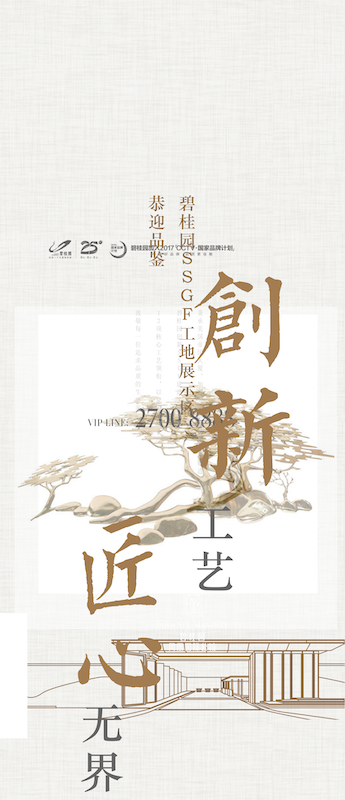

### XGBoost Analysis
XGBoost model uses a graident boosting algorithm to implement machine learning prediction

**Inputs**: 

|width|height|xmin|ymin|xmax|ymax|
|-----|------|----|----|----|----|
|3365.0|4960.0|130.943266|2641.117911|3056.174873|3938.119096|
|530.0  | 546.0 |  398.387161 |  681.459717  |1082.647551 | 1078.003818|
|1355.0 | 1355.0  | 455.852172  | 738.254618 | 1223.961207 | 1173.219835|
|1564.0 | 1566.0   |400.142435   |630.608587 | 1351.087420 | 1359.807868|
|3364.0  | 704.0|  1641.121945 |  960.335295  |2441.670330 | 1093.033422|
|4107.0 |  983.0 | 1093.556990  | 770.246822  |2386.957927   |987.176591|
|4286.0  |1317.0 | 2026.147064 | 1504.405753  |3132.509264  |1599.873141|
|2562.0  |2475.0   |927.652803  |1314.572335  |1249.234076  |1433.921758|
|898.0    |93.0   |313.110120   |113.112915   |561.777769   |226.515633|
|342.0   |348.0   |249.656984   |525.275889   |513.972849   |581.560096|
|713.0    |93.0   |492.655027   |994.701960  |1044.564271  |1225.640362|
|327.0   |874.0   |235.790528   |500.561502   |593.710909   |655.502067|
|227.0  |1066.0   |116.077132   |332.891634   |467.075238   |610.364364|
|1028.0  |2529.0   |370.625163  |1536.492660  |759.536914  |1707.244277|

**Output Image**:
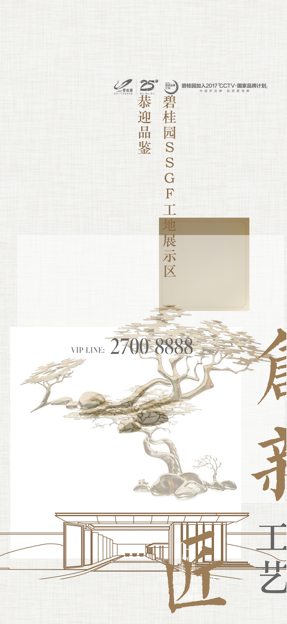

### Pytorch Analysis
Pytorch neural network data analysis process:
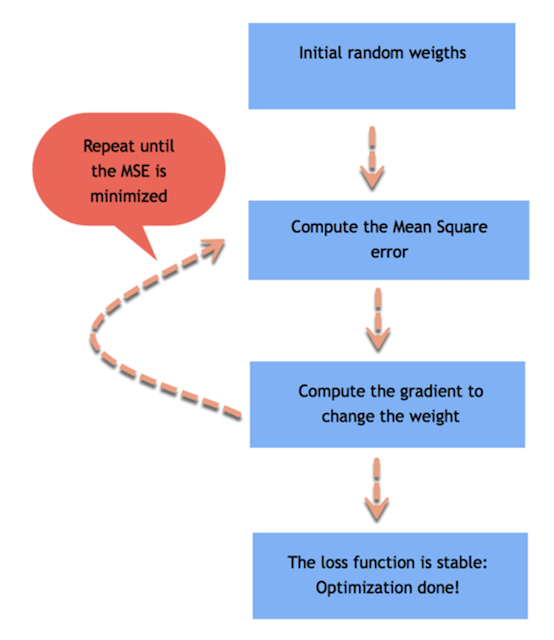

**Test run of layer 10 with an epoch of 1000:** <br>
Loss: Determines the accuracy of the neural network prediction

In [2]:
import pandas as pd
import numpy as np
import torch
import torch.optim as optim
from sklearn import preprocessing
import warnings
warnings.filterwarnings("ignore")

datax = pd.read_csv("test10.csv").values

xdata = np.transpose(datax[:,0:6])
ydata = np.transpose(datax[:,6])
xdata = torch.from_numpy(xdata)
ydata = torch.from_numpy(ydata)

n = 6

xin = pd.read_csv("output.csv").values
xin = np.array(xin[0])
xin = xin.reshape(-1, 1)

A = torch.randn((1,n), requires_grad=True)
b = torch.randn(1, requires_grad=True)

def model(x_input):
    x_transformed = preprocessing.MinMaxScaler().fit_transform(x_input)
    x_transformed = torch.from_numpy(x_transformed)
    return A.mm(x_transformed.float()) + b

loss_fn = torch.nn.MSELoss()
optimizer = optim.Adam([A,b], lr=0.0001)

for t in range(1000):
    predy2 = model(xin)

    current_loss = loss_fn(predy2.double(), ydata)

    optimizer.zero_grad()
    current_loss.backward()
    optimizer.step()
print(f"t = {t}, loss = {current_loss.data.cpu().numpy()}")





t = 999, loss = 1.3047643190191909


Loss is reduced over epochs as algorithm adjusts its weights over time. Length of epoch determines the accuracy of the model. 

**Image Produced**:
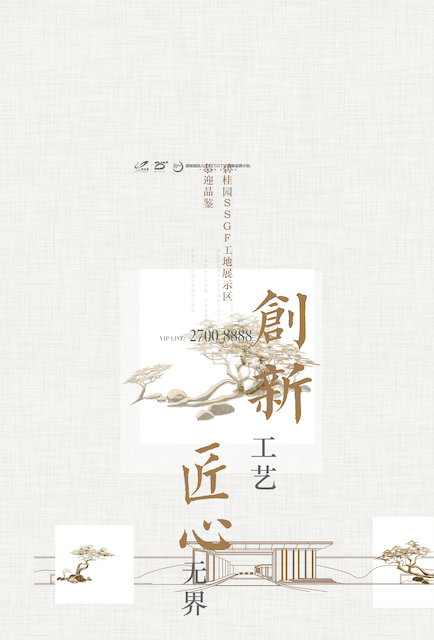

### Error Analysis
Root mean square deviation comparison between different testing models <br>
RMSE values closer to zero indicate higher accuracy by model


#### RMSE Analysis Results:

| Layer # | LinerRegression | BaysianRidge | HuberRegressor | RANSCARRegressor | TheilSenRegressor | ElasticNet | ARDRegression | KernelRidge | DecisionTreeRegressor | KNeighborsRegressor | RandomForestRegressor | XGBoost | PyTorch |
|---------|-----------------|--------------|----------------|------------------|-------------------|------------|---------------|-------------|-----------------------|---------------------|-----------------------|---------|---------|
| 10      | 0.161           | 0.154        | 0.155          | 0.183            | 0.244             | 0.154      | 0.173         | 0.289       | 0.172                 | 0.098               | 0.089                 | 0.135   | 0.173   |
| 20      | 0.289           | 0.289        | 0.289          | 0.290            | 0.321             | 0.293      | 0.304         | 0.344       | 0.385                 | 0.228               | 0.194                 | 0.284   | 0.304   |
| 30      | 0.262           | 0.261        | 0.262          | 0.263            | 0.325             | 0.258      | 0.293         | 0.346       | 0.308                 | 0.183               | 0.155                 | 0.230   | 0.293   |
| 40      | 0.220           | 0.220        | 0.220          | 0.222            | 0.289             | 0.227      | 0.241         | 0.338       | 0.266                 | 0.156               | 0.134                 | 0.191   | 0.241   |
| 50      | 0.178           | 0.178        | 0.181          | 0.186            | 0.239             | 0.152      | 0.194         | 0.278       | 0.172                 | 0.108               | 0.091                 | 0.133   | 0.194   |
| 60      | 0.160           | 0.160        | 0.160          | 0.161            | 0.202             | 0.161      | 0.171         | 0.245       | 0.182                 | 0.111               | 0.097                 | 0.144   | 0.171   |
| 70      | 0.149           | 0.149        | 0.151          | 0.172            | 0.206             | 0.170      | 0.159         | 0.265       | 0.188                 | 0.104               | 0.100                 | 0.126   | 0.159   |
| 80      | 0.326           | 0.324        | 0.324          | 0.343            | 0.402             | 0.318      | 0.353         | 0.405       | 0.373                 | 0.230               | 0.194                 | 0.291   | 0.353   |
| 90      | 0.216           | 0.216        | 0.217          | 0.219            | 0.299             | 0.218      | 0.235         | 0.276       | 0.259                 | 0.159               | 0.134                 | 0.200   | 0.235   |
| 100     | 0.161           | 0.160        | 0.160          | 0.162            | 0.224             | 0.155      | 0.171         | 0.350       | 0.171                 | 0.105               | 0.089                 | 0.129   | 0.171   |
| 110     | 0.184           | 0.183        | 0.183          | 0.184            | 0.192             | 0.163      | 0.187         | 0.236       | 0.228                 | 0.142               | 0.116                 | 0.172   | 0.187   |
| 120     | 0.148           | 0.147        | 0.148          | 0.150            | 0.185             | 0.152      | 0.155         | 0.268       | 0.176                 | 0.109               | 0.093                 | 0.131   | 0.155   |
| 130     | 0.125           | 0.125        | 0.125          | 0.126            | 0.146             | 0.124      | 0.132         | 0.242       | 0.154                 | 0.090               | 0.076                 | 0.112   | 0.132   |
| 140     | 0.120           | 0.120        | 0.121          | 0.120            | 0.159             | 0.116      | 0.269         | 0.259       | 0.112                 | 0.046               | 0.052                 | 0.038   | 0.269   |
|||||
| Average | 0.193           | 0.192        | 0.193          | 0.199            | 0.245             | 0.190      | 0.217         | 0.296       | 0.225                 | 0.134               | 0.115                 | 0.165   | 0.217   |



### Visual Comparison:

|1. Linear Regression|XGBoost|PyTorch|
|-|-|-|
|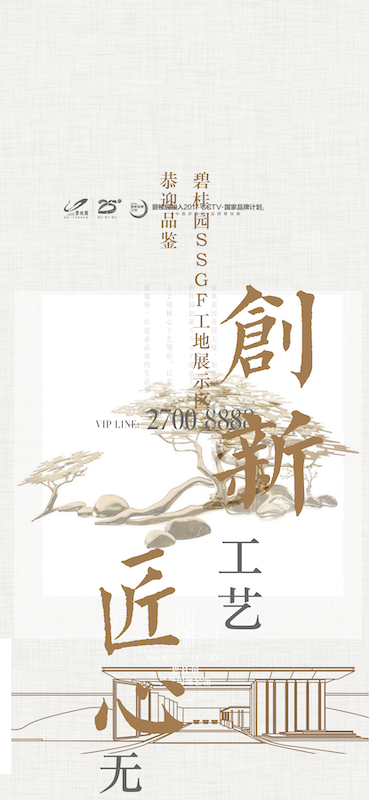|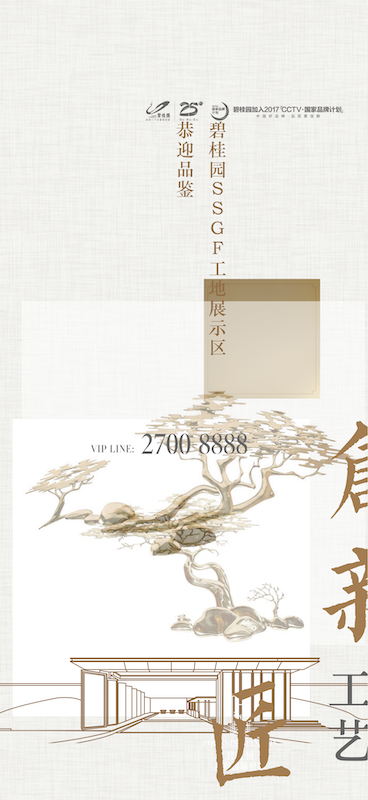|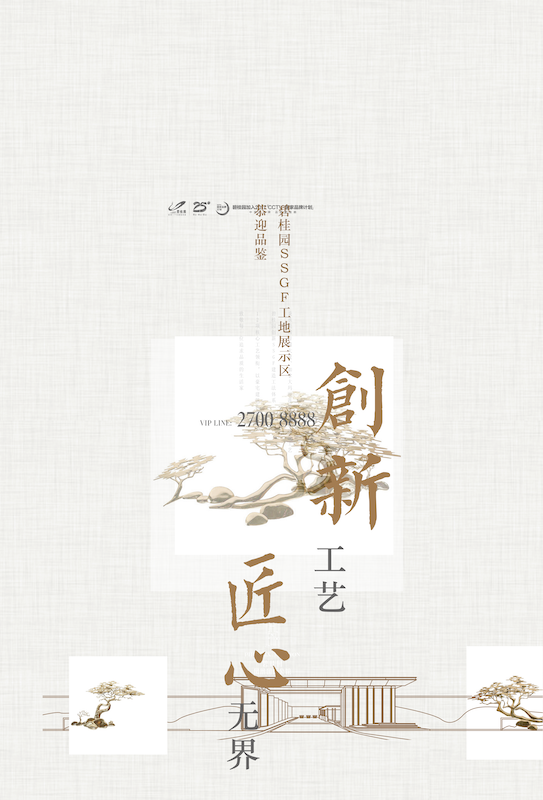|

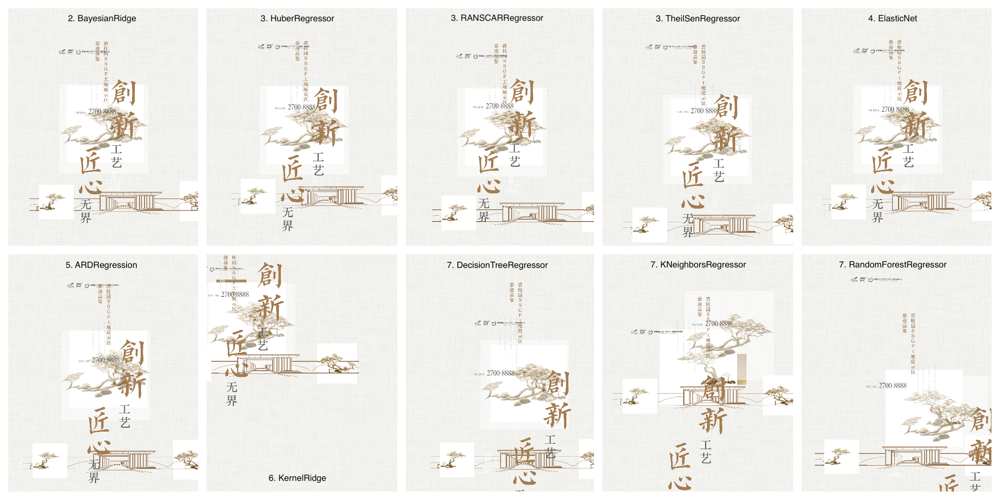

#### Visual Analysis:
Linear Regression: Contains 10/11 elements in frame
XGBoost: Contains 10/11 elements in frame
PyTorch: Contains 10/11 elements in frame
All three models fail to display all layer elements in frame. The PyTorch model displays the layers on a wider background. Out of the three models, the PyTorch model is the most visually appealing and the most viable option for display. <br>

However all three models failed to accurately display the layers in a cohesive layout. Many layers are overlapping each other and the images produced are not visually appealing. More efficient and accurate regression models need to be tested to generate an appealing image layout. 